In [1]:
using Revise
using Bilevel

using RigidBodyDynamics
using MeshCatMechanisms
using MeshCat
using ForwardDiff
using Plots

┌ Info: Precompiling Bilevel [9688c538-179f-11e9-3174-495cea6b7f67]
└ @ Base loading.jl:1187


HTML{String}("    <script class='js-collapse-script'>\n        var curMatch =\n            window.location.href\n            .match(/(.*?)\\/notebooks\\/.*\\.ipynb/);\n\n        curMatch = curMatch ||\n            window.location.href\n            .match(/(.*?)\\/apps\\/.*\\.ipynb/);\n\n        if ( curMatch ) {\n            \$('head').append('<base href=\"' + curMatch[1] + '/\">');\n        }\n    </script>\n")

HTML{String}("<script class='js-collapse-script' src='/assetserver/ac453cbe1838fe7a6d3794b312bfa72db072de98-assets/webio/dist/bundle.js'></script>")

HTML{String}("<script class='js-collapse-script' src='/assetserver/ac453cbe1838fe7a6d3794b312bfa72db072de98-assets/providers/ijulia_setup.js'></script>")

HTML{String}("  <script class='js-collapse-script'>\n    \$('.js-collapse-script').parent('.output_subarea').css('padding', '0');\n  </script>\n")

┌ Warning: `using A: B` will only be allowed for single bindings, not modules. Use `using A.B` instead
│   caller = ip:0x0
└ @ Core :-1


# Single Point Example

In [ ]:
urdf = joinpath("..", "..", "urdf", "ball.urdf")
mechanism = parse_urdf(Float64, urdf)

body = findbody(mechanism, "ball")
basejoint = joint_to_parent(body, mechanism)
floatingjoint = Joint(basejoint.name, frame_before(basejoint), frame_after(basejoint), QuaternionFloating{Float64}())
replace_joint!(mechanism, basejoint, floatingjoint)

motion_type = :xyz
floor_body = findbody(mechanism, "floor")
point = Point3D(default_frame(floor_body), [0.,0.,0.])
normal = FreeVector3D(default_frame(floor_body), [0.,0.,1.])
hs = HalfSpace(point, normal)
μ = 0.5
floor = Obstacle(hs, μ, motion_type, floor_body)

obstacles = [floor]

env = parse_contacts(mechanism, urdf, obstacles)
x0 = MechanismState(mechanism)
Δt = .005;

In [ ]:
sim_data = get_sim_data_bilevel(mechanism,env,Δt)

q0 = [1., 0., 0., 0., 0., 0., 0.015]
v0 = [0., 0., 0., 1.1, .2, 0.]
N = 25

set_configuration!(x0, q0)
set_velocity!(x0, v0)
setdirty!(x0)

ctrl! = (u,t,x) -> u[:] .= 0.

traj_bi = Bilevel.simulate_bilevel(sim_data,ctrl!,x0,N-1)
traj_bi_t = vcat(0.,cumsum([Δt for i in 1:N-1]));
traj_bi_q = [traj_bi[1:num_positions(mechanism),i] for i in 1:N];

In [ ]:
sim_data = get_sim_data(mechanism,env,Δt,false)

set_configuration!(x0, q0)
set_velocity!(x0, v0)
setdirty!(x0)

ctrl! = (u,t,x) -> u[:] .= 0.

traj_st = Bilevel.simulate_snopt(sim_data,ctrl!,x0,N-1)
traj_st_t = vcat(0.,cumsum([Δt for i in 1:N-1]));
traj_st_q = [traj_st[1:num_positions(mechanism),i] for i in 1:N];

In [ ]:
j = 11
clibrary(:Plots)
gr(size=(800,500), html_output_format=:png, 
    seriescolor=:magma,  background_color_legend=:white, 
    background=RGB(((240,240,240) ./ 255.)...));
plot(traj_st_t,traj_st[j,:],label="Stewart-Trinkle",seriescolor=RGB(((227,74,51) ./ 255.)...),linewidth=4)
plot!(traj_bi_t,traj_bi[j,:],label="Bilevel Solver",seriescolor=RGB(((254,232,200) ./ 255.)...),linewidth=0,marker=4)

# Ball 2d TrajOpt

In [2]:
urdf = joinpath("..", "..", "urdf", "ball2d.urdf")
mechanism = parse_urdf(Float64, urdf)
mvis = MechanismVisualizer(mechanism, URDFVisuals(urdf))

motion_type = :xyz
floor_body = findbody(mechanism, "floor")
point = Point3D(default_frame(floor_body), [0.,0.,0.])
normal = FreeVector3D(default_frame(floor_body), [0.,0.,1.])
hs = HalfSpace(point, normal)
μ = 0.5
floor = Obstacle(hs, μ, motion_type, floor_body)

obstacles = [floor]

env = parse_contacts(mechanism, urdf, obstacles)
x0 = MechanismState(mechanism)

MechanismState{Float64, Float64, Float64, …}(…)

In [30]:
N = 10
Δt = 0.01

sim_data = get_sim_data(mechanism,env,Δt,false)

q0 = [0., 0.015, 0.]
v0 = [.5, 0., 0.]
N = 25

set_configuration!(x0, q0)
set_velocity!(x0, v0)
setdirty!(x0)

ctrl! = (u,t,x) -> u[:] .= 0.

traj_st = Bilevel.simulate_snopt(sim_data,ctrl!,x0,N-1)
traj_st_t = vcat(0.,cumsum([Δt for i in 1:N-1]));
traj_st_q = [traj_st[1:num_positions(mechanism),i] for i in 1:N];

Finished successfully: optimality conditions satisfied
Finished successfully: optimality conditions satisfied
Finished successfully: optimality conditions satisfied
Finished successfully: optimality conditions satisfied
Finished successfully: requested accuracy could not be achieved
Finished successfully: optimality conditions satisfied
Finished successfully: optimality conditions satisfied
Finished successfully: optimality conditions satisfied
Finished successfully: optimality conditions satisfied
Finished successfully: optimality conditions satisfied
Finished successfully: optimality conditions satisfied
Finished successfully: optimality conditions satisfied
Finished successfully: optimality conditions satisfied
Finished successfully: optimality conditions satisfied
Finished successfully: optimality conditions satisfied
Finished successfully: optimality conditions satisfied
Finished successfully: optimality conditions satisfied
Finished successfully: optimality conditions satisfied
F

In [35]:
N = 10
Δt = 0.01

traj_data = get_traj_data(mechanism,env,Δt,N,false,min_τ=false,min_v=false)

q0 = [0., 0.015, 0.]
add_state_eq!(traj_data, xi->xi[1:num_positions(mechanism)]-q0, 1, con_len=num_positions(mechanism))
add_state_eq!(traj_data, xi->xi[5], 1, con_len=1)

# final x position
add_state_eq!(traj_data, xi->xi[1]-.03, N, con_len=1)
add_state_eq!(traj_data, xi->xi[4], N, con_len=1)

traj_st = Bilevel.trajopt_snopt(traj_data,opt_tol=1e-3,major_feas=1e-6,minor_feas=1e-6)
traj_st_t = vcat(0.,cumsum([Δt for i in 1:N-1]));
traj_st_q = [traj_st[1:num_positions(mechanism),i] for i in 1:N]

The problem appears to be infeasible: nonlinear infeasibilities minimized


10-element Array{Array{Float64,1},1}:
 [0.0, 0.015, 0.0]                  
 [0.00533052, 0.014019, 1.4138e-15] 
 [0.010661, 0.012057, 2.8276e-15]   
 [0.0159915, 0.009114, 7.0291e-15]  
 [0.0213221, 0.00519, 8.44984e-15]  
 [0.0266526, 0.000285, 1.53835e-14] 
 [0.0284233, 0.0, -0.115935]        
 [0.0294757, 9.57245e-14, -0.231869]
 [0.03, -2.21126e-13, -0.347804]    
 [0.03, 0.0, -0.463738]             

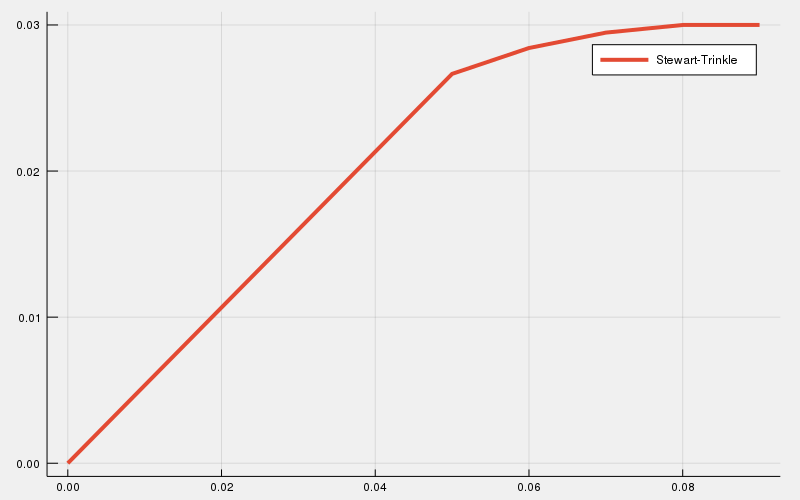

In [36]:
j = 1
clibrary(:Plots)
gr(size=(800,500), html_output_format=:png, 
    seriescolor=:magma,  background_color_legend=:white, 
    background=RGB(((240,240,240) ./ 255.)...));
plot(traj_st_t,traj_st[j,:],label="Stewart-Trinkle",seriescolor=RGB(((227,74,51) ./ 255.)...),linewidth=4)
# plot!(traj_bi_t,traj_bi[j,:],label="Bilevel Solver",seriescolor=RGB(((254,232,200) ./ 255.)...),linewidth=0,marker=4)

In [37]:
setanimation!(mvis, traj_st_t, traj_st_q)

In [48]:
N = 10
Δt = 0.01

traj_data = get_traj_data_bilevel(mechanism,env,Δt,N,min_τ=true,min_v=false)

q0 = [0., 0.015, 0.]
add_state_eq!(traj_data, xi->xi[1:num_positions(mechanism)]-q0, 1, con_len=num_positions(mechanism))
add_state_eq!(traj_data, xi->xi[5], 1, con_len=1)

# final x position
add_state_eq!(traj_data, xi->xi[1]-.03, N, con_len=1)
add_state_eq!(traj_data, xi->xi[4], N, con_len=1)

traj_bi = Bilevel.trajopt_bilevel(traj_data,opt_tol=1e-3,major_feas=1e-3,minor_feas=1e-3)
traj_bi_t = vcat(0.,cumsum([Δt for i in 1:N-1]));
traj_bi_q = [traj_bi[1:num_positions(mechanism),i] for i in 1:N]

Finished successfully: optimality conditions satisfied


10-element Array{Array{Float64,1},1}:
 [0.0, 0.015, 0.0]                 
 [0.005133, 0.0140191, 0.0109745]  
 [0.0102559, 0.0120574, 0.0210185] 
 [0.0153606, 0.00911529, 0.0387497]
 [0.0204322, 0.00519463, 0.0700077]
 [0.0254707, 0.00029589, 0.101237] 
 [0.0275414, 0.0, 0.0724962]       
 [0.0289972, 0.0, 0.114373]        
 [0.0299812, -1.92887e-6, 0.157958]
 [0.03, 3.97481e-14, -0.402951]    

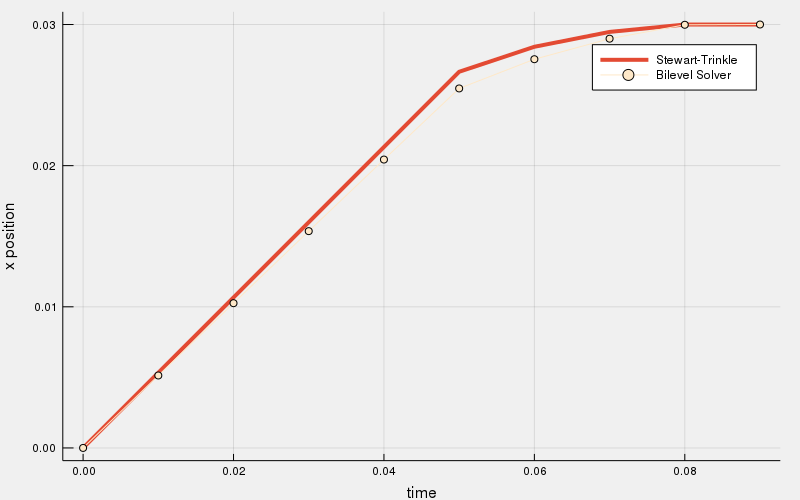

Error handling websocket connection:
WebSockets.WebSocketClosedError("ws|server respond to OPCODE_CLOSE 1001:Going Away")┌ Info: Closed (2):  💀    1↑     1↓🔒 61291s 0.0.0.0:8700:8700 ≣16
└ @ HTTP.Servers /Users/blandry/.julia/packages/HTTP/YjRCz/src/Servers.jl:351


In [53]:
j = 1
clibrary(:Plots)
gr(size=(800,500), html_output_format=:png, 
    seriescolor=:magma,  background_color_legend=:white, 
    background=RGB(((240,240,240) ./ 255.)...));
plot(traj_st_t,traj_st[j,:],label="Stewart-Trinkle",seriescolor=RGB(((227,74,51) ./ 255.)...),linewidth=4)
plot!(traj_bi_t,traj_bi[j,:],label="Bilevel Solver",seriescolor=RGB(((254,232,200) ./ 255.)...),
    linewidth=0,marker=4,xlabel="time",ylabel="x position")

# Compass Gait Simulation

In [ ]:
urdf = joinpath("..", "..", "urdf", "compass.urdf")
mechanism = parse_urdf(Float64, urdf)

mvis = MechanismVisualizer(mechanism, URDFVisuals(urdf))

motion_type = :xyz
floor_body = findbody(mechanism, "floor")
point = Point3D(default_frame(floor_body), [0.,0.,0.])
normal = FreeVector3D(default_frame(floor_body), [0.,0.,1.])
hs = HalfSpace(point, normal)
μ = .95
floor = Obstacle(hs, μ, motion_type, floor_body)

obstacles = [floor]

env = parse_contacts(mechanism, urdf, obstacles)
x0 = MechanismState(mechanism)
Δt = 0.005

# q0 = configuration(mvis.state)
q0 = [-.3, -1.14, 0.16, -.5]
v0 = zeros(num_velocities(mechanism))
N = 200;

In [ ]:
IJuliaCell(mvis)

In [6]:
open(mvis)

┌ Info: Serving MeshCat visualizer at http://127.0.0.1:8700
└ @ MeshCat /Users/blandry/.julia/packages/MeshCat/jt9Xz/src/servers.jl:7
┌ Info: Listening on: Sockets.InetAddr{Sockets.IPv4}(ip"0.0.0.0", 0x21fc)
└ @ HTTP.Servers /Users/blandry/.julia/packages/HTTP/YjRCz/src/Servers.jl:301
┌ Info: Accept (0):  🔗    0↑     0↓    1s 0.0.0.0:8700:8700 ≣16
└ @ HTTP.Servers /Users/blandry/.julia/packages/HTTP/YjRCz/src/Servers.jl:343
┌ Info: Accept (1):  🔗    0↑     0↓    1s 0.0.0.0:8700:8700 ≣16
└ @ HTTP.Servers /Users/blandry/.julia/packages/HTTP/YjRCz/src/Servers.jl:343


Process(`open http://127.0.0.1:8700`, ProcessExited(0))

┌ Info: Accept (2):  🔗    0↑     0↓    0s 0.0.0.0:8700:8700 ≣16
└ @ HTTP.Servers /Users/blandry/.julia/packages/HTTP/YjRCz/src/Servers.jl:343
┌ Warning: `wait(t::Task)` is deprecated, use `fetch(t)` instead.
│   caller = macro expansion at task.jl:265 [inlined]
└ @ Core ./task.jl:265


In [9]:
widget = manipulate!(mvis)

Widgets.Widget{:rbd_manipulator,Any}(OrderedCollections.OrderedDict{Symbol,Any}(:floor_to_world=>Widget{:rbd_joint,Any}(OrderedCollections.OrderedDict{Symbol,Any}(), Observable{Any} with 1 listeners. Value:
nothing, nothing, defaultlayout),:floor_to_ball=>Widget{:rbd_joint,Any}(OrderedCollections.OrderedDict{Symbol,Any}(:q1=>Widget{:slider,Float64}(OrderedCollections.OrderedDict{Symbol,Any}(:changes=>Observable{Int64} with 1 listeners. Value:
0,:index=>Observable{Any} with 2 listeners. Value:
315,:formatted_vals=>Observable{Any} with 1 listeners. Value:
["-3.14159", "-3.13159", "-3.12158", "-3.11158", "-3.10157", "-3.09157", "-3.08156", "-3.07156", "-3.06155", "-3.05155"  …  "3.05155", "3.06155", "3.07156", "3.08156", "3.09157", "3.10157", "3.11158", "3.12158", "3.13159", "3.14159"],:formatted_value=>Observable{String} with 1 listeners. Value:
"0.0",:value=>Observable{Float64} with 2 listeners. Value:
0.0), Observable{Float64} with 2 listeners. Value:
0.0, Scope("knockout-component-2fe8ba47-6d4c-490f-9f1b-6f2768c4edbc", Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :label), Any["floor_to_ball.q1"], Dict{Symbol,Any}(:className=>"interact ",:style=>Dict{Any,Any}(:padding=>"5px 10px 0px 10px")), 1)], Dict{Symbol,Any}(:attributes=>Dict("class"=>"interact-flex-row-left")), 2), Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :input), Any[], Dict{Symbol,Any}(:max=>629,:min=>1,:attributes=>Dict{Any,Any}(:type=>"range",Symbol("data-bind")=>"numericValue: index, valueUpdate: 'input', event: {change : function () {this.changes(this.changes()+1)}}","orient"=>"horizontal"),:step=>1,:className=>"slider slider is-fullwidth",:style=>Dict{Any,Any}()), 0)], Dict{Symbol,Any}(:attributes=>Dict("class"=>"interact-flex-row-center")), 1), Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :p), Any[], Dict{Symbol,Any}(:attributes=>Dict("data-bind"=>"text: formatted_value")), 0)], Dict{Symbol,Any}(:attributes=>Dict("class"=>"interact-flex-row-right")), 1)], Dict{Symbol,Any}(:attributes=>Dict("class"=>"interact-flex-row")), 7), Dict{String,Tuple{Observables.AbstractObservable,Union{Nothing, Bool}}}("formatted_vals"=>(Observable{Any} with 1 listeners. Value:
["-3.14159", "-3.13159", "-3.12158", "-3.11158", "-3.10157", "-3.09157", "-3.08156", "-3.07156", "-3.06155", "-3.05155"  …  "3.05155", "3.06155", "3.07156", "3.08156", "3.09157", "3.10157", "3.11158", "3.12158", "3.13159", "3.14159"], nothing),"changes"=>(Observable{Int64} with 1 listeners. Value:
0, nothing),"formatted_value"=>(Observable{String} with 1 listeners. Value:
"0.0", nothing),"index"=>(Observable{Any} with 2 listeners. Value:
315, nothing)), Set(String[]), nothing, Any["knockout"=>"/Users/blandry/.julia/packages/Knockout/JIqpG/src/../assets/knockout.js", "knockout_punches"=>"/Users/blandry/.julia/packages/Knockout/JIqpG/src/../assets/knockout_punches.js", "/Users/blandry/.julia/packages/InteractBase/PTCUD/src/../assets/style.css"], Dict{Any,Any}("formatted_vals"=>Any[JSString("(function (val){return (val!=this.model[\"formatted_vals\"]()) ? (this.valueFromJulia[\"formatted_vals\"]=true, this.model[\"formatted_vals\"](val)) : undefined})")],"_promises"=>Dict{Any,Any}("importsLoaded"=>Any[JSString("function (ko, koPunches) {\n    ko.punches.enableAll();\n    ko.bindingHandlers.numericValue = {\n        init : function(element, valueAccessor, allBindings, data, context) {\n            var stringified = ko.observable(ko.unwrap(valueAccessor()));\n            stringified.subscribe(function(value) {\n                var val = parseFloat(value);\n                if (!isNaN(val)) {\n                    valueAccessor()(val);\n                }\n            })\n            valueAccessor().subscribe(function(value) {\n                var str = JSON.stringify(value);\n                if ((str == \"0\") && ([\"-0\", \"-0.\"].indexOf(stringified()) >= 0))\n                     return;\n                 if ([\"null\", \"\"].indexOf(str) >= 0)\n             

### Stewart-Trinkle

In [ ]:
sim_data = get_sim_data(mechanism,env,Δt,false)

set_configuration!(x0, q0)
set_velocity!(x0, v0)
setdirty!(x0)

ctrl! = (u,t,x) -> u[:] .= 0.

traj_st = Bilevel.simulate_snopt(sim_data,ctrl!,x0,N-1)
traj_st_t = vcat(0.,cumsum([Δt for i in 1:N-1]));
traj_st_q = [traj_st[1:num_positions(mechanism),i] for i in 1:N]

In [ ]:
setanimation!(mvis, traj_st_t, traj_st_q)

### Bilevel Solver

In [ ]:
sim_data = get_sim_data_bilevel(mechanism,env,Δt)

set_configuration!(x0, q0)
set_velocity!(x0, v0)
setdirty!(x0)

ctrl! = (u,t,x) -> u[:] .= 0.

traj_bi = Bilevel.simulate_bilevel(sim_data,ctrl!,x0,N-1)
traj_bi_t = vcat(0.,cumsum([Δt for i in 1:N-1]));
traj_bi_q = [traj_bi[1:num_positions(mechanism),i] for i in 1:N]

In [ ]:
setanimation!(mvis, traj_bi_t, traj_bi_q)

# Compass Gait Trajectory Optimization

In [ ]:
N = 10
Δt = 0.01;

traj_data = get_traj_data(mechanism,env,Δt,N,false,min_τ=true,min_v=false)

q0 = [0., -1., 0., 0.]
v0 = zeros(num_velocities(mechanism))
x_start = vcat(q0,v0)
add_state_eq!(traj_data, xi -> xi - x_start, 1)

qf = [1., -1., 0., 0.]
vf = zeros(num_velocities(mechanism))
x_goal = vcat(qf,vf)
add_state_eq!(traj_data, xi -> xi - x_goal, N)

for i = 2:N-1
    add_fn_ineq!(traj_data, xi -> -xi[2] - 1., i) 
end

traj_st = Bilevel.trajopt_snopt(traj_data,opt_tol=1e-3,major_feas=1e-6,minor_feas=1e-6)
traj_st_t = vcat(0.,cumsum([Δt for i in 1:N-1]));
traj_st_q = [traj_st[1:num_positions(mechanism),i] for i in 1:N]
push!(traj_st_t, traj_st_t[end])
push!(traj_st_q, traj_st_q[end])

In [ ]:
setanimation!(mvis, traj_st_t, traj_st_q)

### Bilevel Solver

In [ ]:
N = 10
Δt = 0.01;

traj_data = get_traj_data_bilevel(mechanism,env,Δt,N,min_τ=true,min_v=false)

q0 = [0., -1., 0., 0.]
v0 = zeros(num_velocities(mechanism))
x_start = vcat(q0,v0)
add_state_eq!(traj_data, xi -> xi - x_start, 1)

qf = [1., -1., 0., 0.]
vf = zeros(num_velocities(mechanism))
x_goal = vcat(qf,vf)
add_state_eq!(traj_data, xi -> xi - x_goal, N)

# for i = 1:N
#     add_fn_ineq!(traj_data, xi -> -xi[2] - 1.1, i) 
# end

traj_bi = Bilevel.trajopt_bilevel(traj_data,opt_tol=1e-3,major_feas=1e-3,minor_feas=1e-3)
traj_bi_t = vcat(0.,cumsum([Δt for i in 1:N-1]));
traj_bi_q = [traj_bi[1:num_positions(mechanism),i] for i in 1:N]
push!(traj_bi_t, traj_bi_t[end])
push!(traj_bi_q, traj_bi_q[end])

In [ ]:
setanimation!(mvis, traj_bi_t, traj_bi_q)

In [ ]:
traj_st[1:4,:] - traj_bi[1:4,:]

# Rimless Wheel

In [ ]:
urdf = joinpath("..", "..", "urdf", "rimless_wheel.urdf")
mechanism = parse_urdf(Float64, urdf)

mvis = MechanismVisualizer(mechanism, URDFVisuals(urdf))

motion_type = :xyz
floor_body = findbody(mechanism, "floor")
point = Point3D(default_frame(floor_body), [0.,0.,0.])
normal = FreeVector3D(default_frame(floor_body), [0.,0.,1.])
hs = HalfSpace(point, normal)
μ = .95
floor = Obstacle(hs, μ, motion_type, floor_body)

obstacles = [floor]

env = parse_contacts(mechanism, urdf, obstacles)
x0 = MechanismState(mechanism)
Δt = 0.05

In [ ]:
IJuliaCell(mvis)

In [ ]:
widget = manipulate!(mvis)

In [ ]:
q0 = [0.,.26,0.]
v0 = [0.,0.,.1]
N = 100;

In [ ]:
sim_data = get_sim_data(mechanism,env,Δt,false)

set_configuration!(x0, q0)
set_velocity!(x0, v0)
setdirty!(x0)

ctrl! = (u,t,x) -> u[:] .= 0.

traj_st = Bilevel.simulate_snopt(sim_data,ctrl!,x0,N-1)
traj_st_t = vcat(0.,cumsum([Δt for i in 1:N-1]));
traj_st_q = [traj_st[1:num_positions(mechanism),i] for i in 1:N]

In [ ]:
setanimation!(mvis, traj_st_t, traj_st_q)

In [ ]:
N = 50

sim_data = get_sim_data_bilevel(mechanism,env,Δt)

set_configuration!(x0, q0)
set_velocity!(x0, v0)
setdirty!(x0)

ctrl! = (u,t,x) -> u[:] .= 0.

traj_bi = Bilevel.simulate_bilevel(sim_data,ctrl!,x0,N-1,opt_tol=1e-3,major_feas=1e-3,minor_feas=1e-3)
traj_bi_t = vcat(0.,cumsum([Δt for i in 1:N-1]));
traj_bi_q = [traj_bi[1:num_positions(mechanism),i] for i in 1:N]

In [ ]:
setanimation!(mvis, traj_bi_t, traj_bi_q)

In [ ]:
open(mvis)